##  **TensorFlow Advanced Linear & Lasso Regression in Python**


In [ ]:
import os
from google.colab import drive
drive.mount('drive/')

Mounted at drive/


In [ ]:
os.chdir('drive/My Drive/LogisticRegression')

In [ ]:
%tensorflow_version 2.x

### **Load Data and Libraries**

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

In [ ]:
# load the data
df = pd.read_csv('data/linear_data.csv')
df.head()

,X,Y
0,4,2
1,4,10
2,7,4
3,7,22
4,8,16


In [ ]:
# split the data into independent and dependent
X = df[['X']].values # convert into numpy array
y = df[['Y']].values # convert into numpy array

In [ ]:
X.shape, y.shape # checking shapes of datasets

((50, 1), (50, 1))

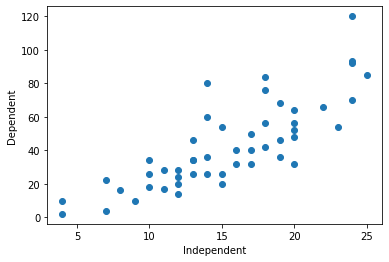

In [ ]:
# scatter plot
plt.scatter(X,y)
plt.xlabel('Independent')
plt.ylabel('Dependent')
plt.show()

### **Linear Regression**

##### **$ \hat y = a + b * X$**

In [ ]:
# linear regression
class regression():
    def __init__(self):
        self.a = tf.Variable(initial_value=0,dtype=tf.float32)
        self.b = tf.Variable(initial_value=0,dtype=tf.float32)

    def __call__(self,X):
        x = tf.convert_to_tensor(X,dtype=tf.float32)
        y_est = tf.add(self.a,tf.multiply(self.b,x))
        return y_est

In [ ]:
model = regression() # calling class

### **loss = sum of square error (sse) = $ \sum (y_t - y_p)^2 $**

In [ ]:
# sum of square loss function
def loss_func(y_true,y_pred):
    # both value is in tensors
    sse = tf.reduce_sum(tf.square(tf.subtract(y_true,y_pred)))
    return sse

### **Gradient Descent**

$ a = a_i - \nabla (sse) | a * LR $

$ b = b_i - \nabla (sse) | b * LR $

In [ ]:
# computing gradient descent based on values of variable or weights
def train(model,inputs,outputs,learning_rate):
    # convert outputs into tensor
    y_true = tf.convert_to_tensor(outputs,dtype=tf.float32)

    # GradientTape
    with tf.GradientTape() as g:
        y_pred = model(inputs) 
        current_loss = loss_func(y_true,y_pred)

    da,db = g.gradient(current_loss,[model.a,model.b])
    # update the values
    model.a.assign_sub(da*learning_rate)
    model.b.assign_sub(db*learning_rate)

### **Fitting**

In [ ]:
def plot_scatter(x,y):
    plt.scatter(x,y) # scatter
    plt.plot(x,model(x),'r--') # line

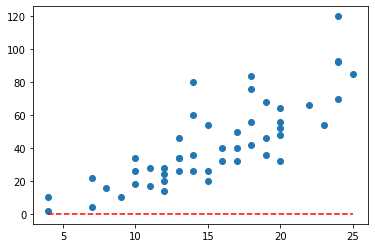

In [ ]:
plot_scatter(X,y)

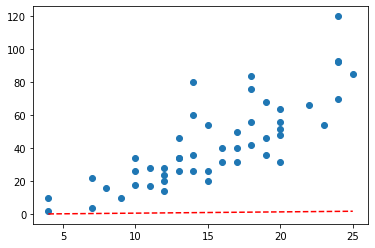

Epoch: 0, Loss: 124903.00, a: 0.00,  b:0.08


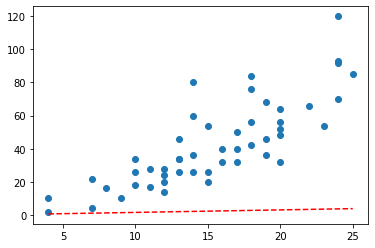

Epoch: 1, Loss: 119039.94, a: 0.01,  b:0.15


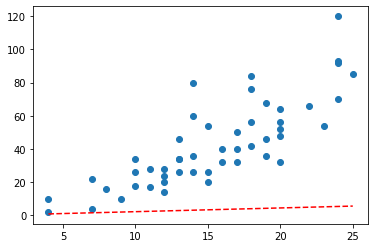

Epoch: 2, Loss: 113484.02, a: 0.01,  b:0.22


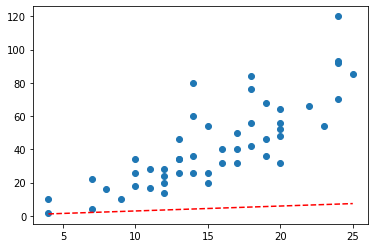

Epoch: 3, Loss: 108219.16, a: 0.02,  b:0.30


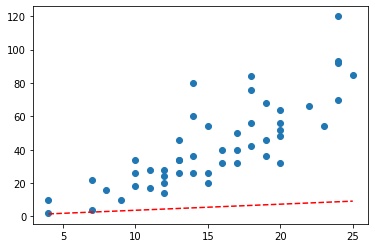

Epoch: 4, Loss: 103230.09, a: 0.02,  b:0.36


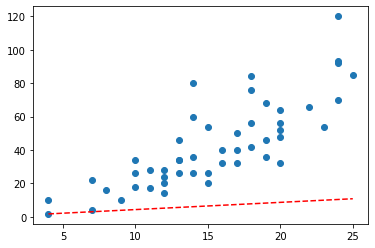

Epoch: 5, Loss: 98502.39, a: 0.02,  b:0.43


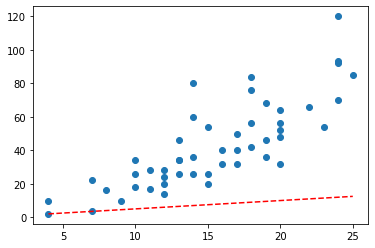

Epoch: 6, Loss: 94022.36, a: 0.03,  b:0.50


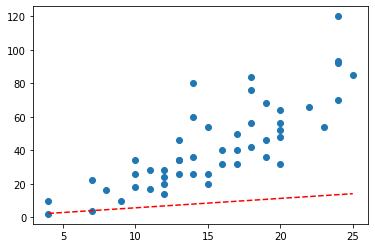

Epoch: 7, Loss: 89777.02, a: 0.03,  b:0.56


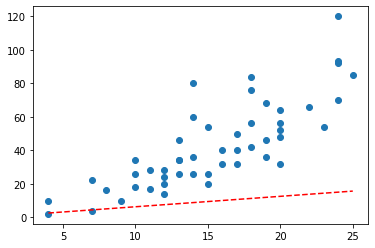

Epoch: 8, Loss: 85754.08, a: 0.03,  b:0.62


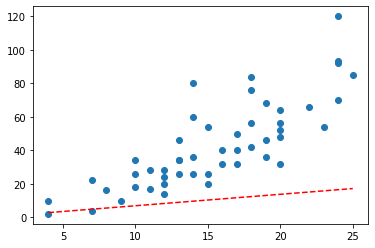

Epoch: 9, Loss: 81941.88, a: 0.04,  b:0.68


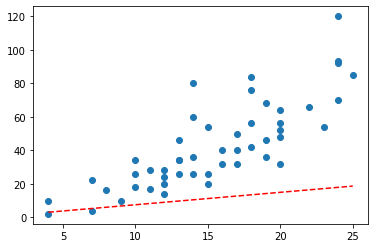

Epoch: 10, Loss: 78329.39, a: 0.04,  b:0.74


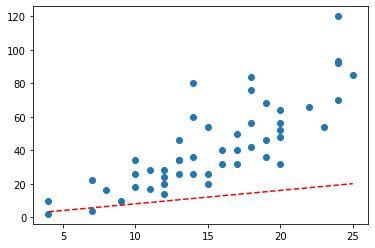

Epoch: 11, Loss: 74906.15, a: 0.04,  b:0.80


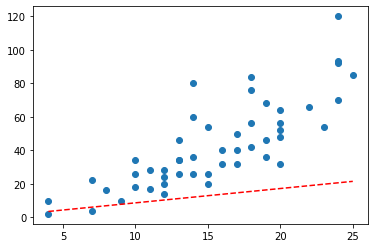

Epoch: 12, Loss: 71662.23, a: 0.05,  b:0.86


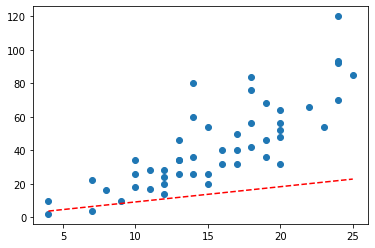

Epoch: 13, Loss: 68588.26, a: 0.05,  b:0.91


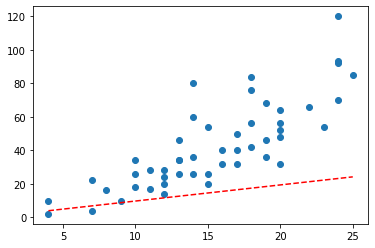

Epoch: 14, Loss: 65675.30, a: 0.05,  b:0.96


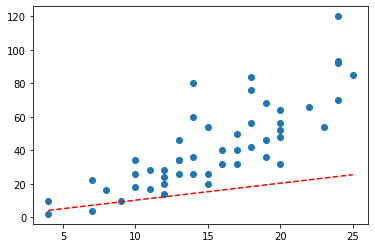

Epoch: 15, Loss: 62914.96, a: 0.06,  b:1.01


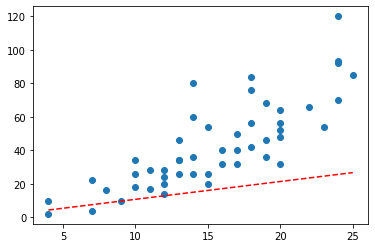

Epoch: 16, Loss: 60299.22, a: 0.06,  b:1.06


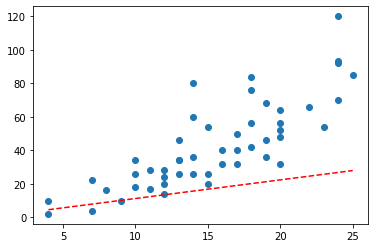

Epoch: 17, Loss: 57820.50, a: 0.06,  b:1.11


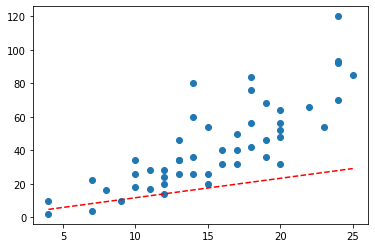

Epoch: 18, Loss: 55471.64, a: 0.06,  b:1.16


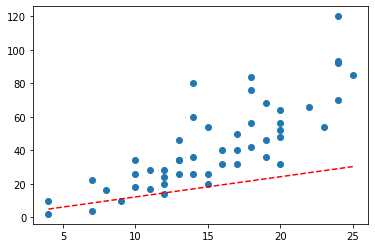

Epoch: 19, Loss: 53245.83, a: 0.07,  b:1.21


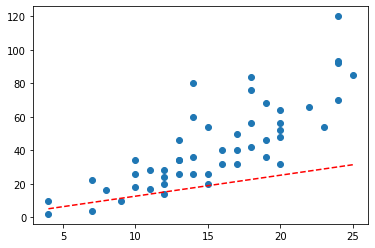

Epoch: 20, Loss: 51136.60, a: 0.07,  b:1.25


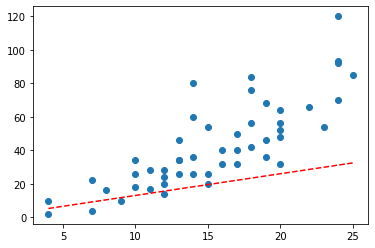

Epoch: 21, Loss: 49137.89, a: 0.07,  b:1.30


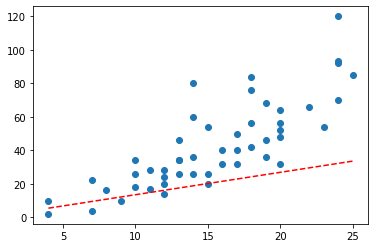

Epoch: 22, Loss: 47243.86, a: 0.07,  b:1.34


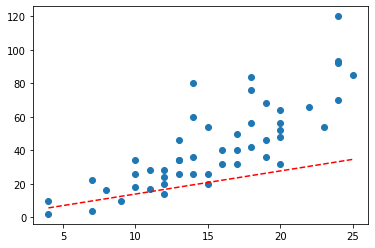

Epoch: 23, Loss: 45449.07, a: 0.08,  b:1.38


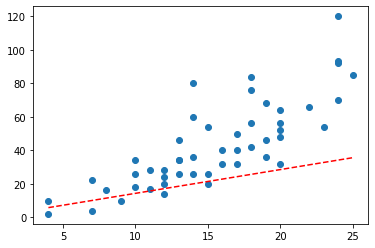

Epoch: 24, Loss: 43748.29, a: 0.08,  b:1.42


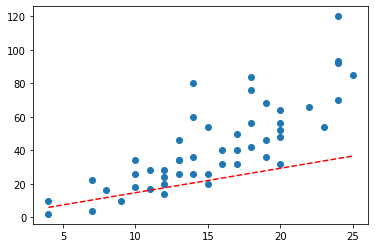

Epoch: 25, Loss: 42136.61, a: 0.08,  b:1.46


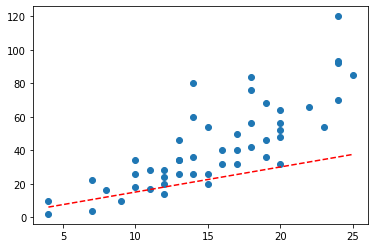

Epoch: 26, Loss: 40609.36, a: 0.08,  b:1.50


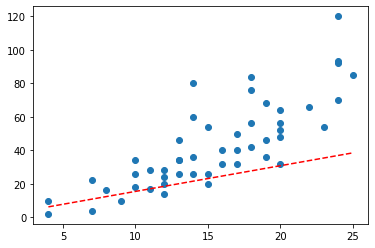

Epoch: 27, Loss: 39162.11, a: 0.08,  b:1.53


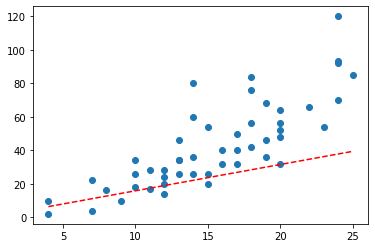

Epoch: 28, Loss: 37790.68, a: 0.09,  b:1.57


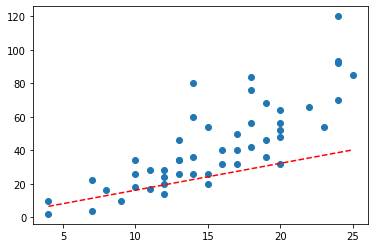

Epoch: 29, Loss: 36491.09, a: 0.09,  b:1.61


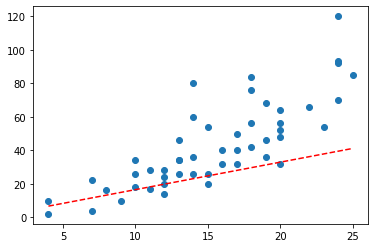

Epoch: 30, Loss: 35259.58, a: 0.09,  b:1.64


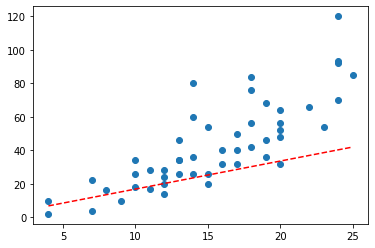

Epoch: 31, Loss: 34092.59, a: 0.09,  b:1.67


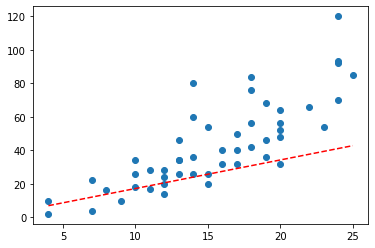

Epoch: 32, Loss: 32986.73, a: 0.09,  b:1.71


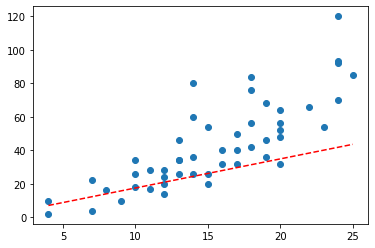

Epoch: 33, Loss: 31938.79, a: 0.09,  b:1.74


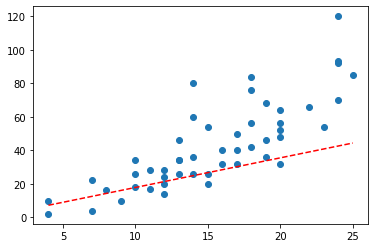

Epoch: 34, Loss: 30945.76, a: 0.10,  b:1.77


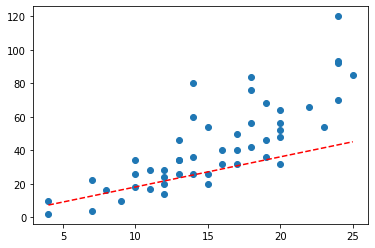

Epoch: 35, Loss: 30004.74, a: 0.10,  b:1.80


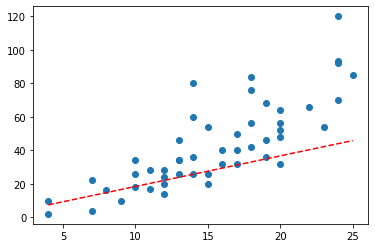

Epoch: 36, Loss: 29113.02, a: 0.10,  b:1.83


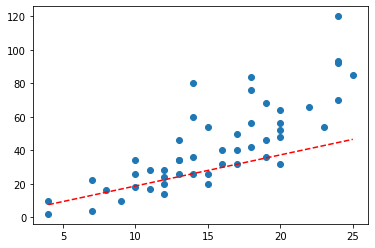

Epoch: 37, Loss: 28268.02, a: 0.10,  b:1.86


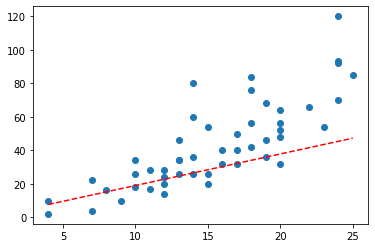

Epoch: 38, Loss: 27467.27, a: 0.10,  b:1.88


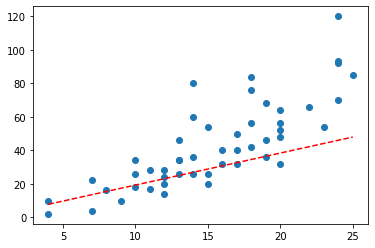

Epoch: 39, Loss: 26708.47, a: 0.10,  b:1.91


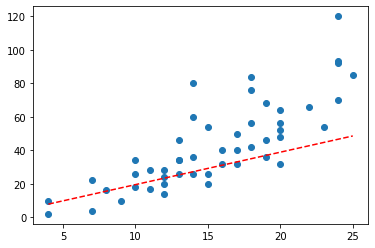

Epoch: 40, Loss: 25989.43, a: 0.11,  b:1.94


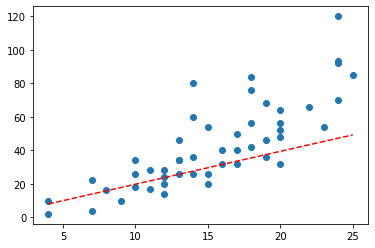

Epoch: 41, Loss: 25308.05, a: 0.11,  b:1.96


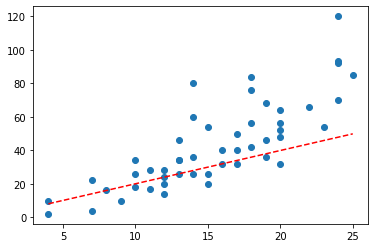

Epoch: 42, Loss: 24662.36, a: 0.11,  b:1.99


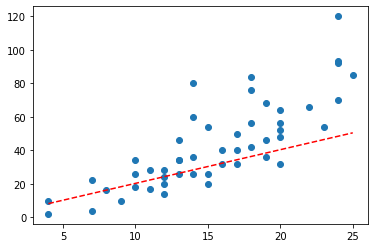

Epoch: 43, Loss: 24050.50, a: 0.11,  b:2.01


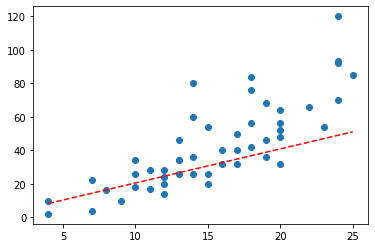

Epoch: 44, Loss: 23470.68, a: 0.11,  b:2.04


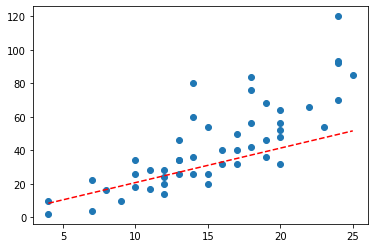

Epoch: 45, Loss: 22921.25, a: 0.11,  b:2.06


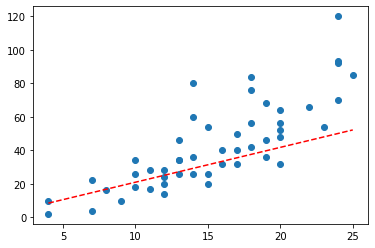

Epoch: 46, Loss: 22400.59, a: 0.11,  b:2.08


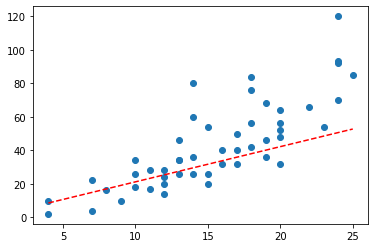

Epoch: 47, Loss: 21907.21, a: 0.11,  b:2.10


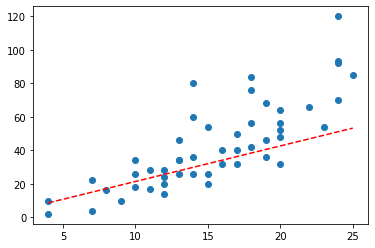

Epoch: 48, Loss: 21439.66, a: 0.11,  b:2.12


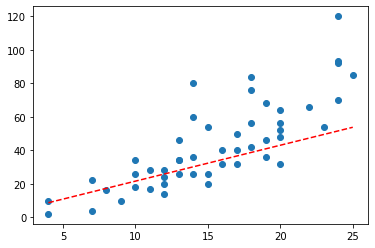

Epoch: 49, Loss: 20996.62, a: 0.12,  b:2.14


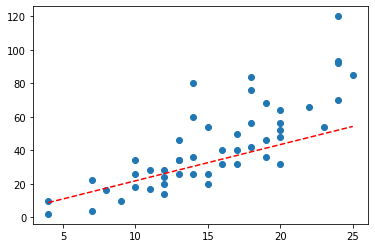

Epoch: 50, Loss: 20576.79, a: 0.12,  b:2.16


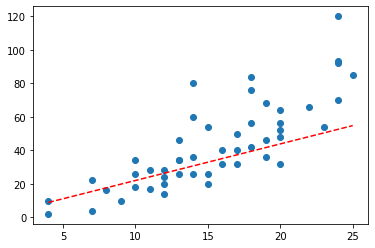

Epoch: 51, Loss: 20178.93, a: 0.12,  b:2.18


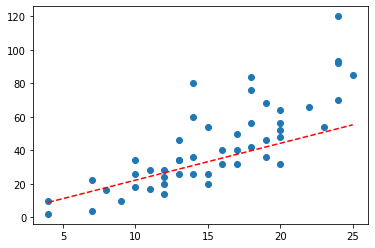

Epoch: 52, Loss: 19801.92, a: 0.12,  b:2.20


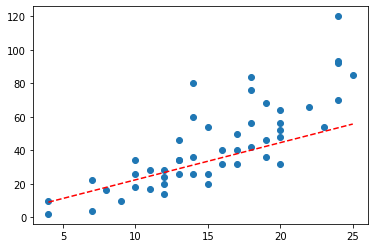

Epoch: 53, Loss: 19444.67, a: 0.12,  b:2.22


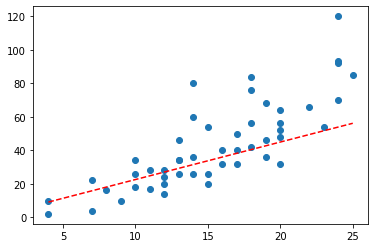

Epoch: 54, Loss: 19106.12, a: 0.12,  b:2.24


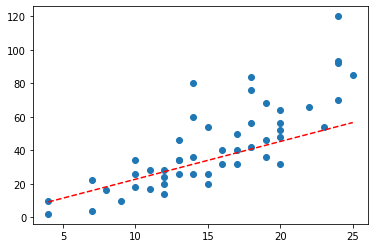

Epoch: 55, Loss: 18785.31, a: 0.12,  b:2.26


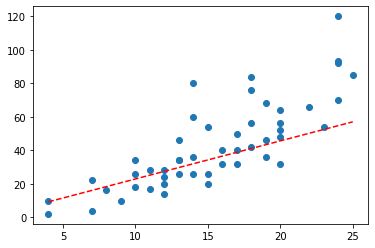

Epoch: 56, Loss: 18481.30, a: 0.12,  b:2.27


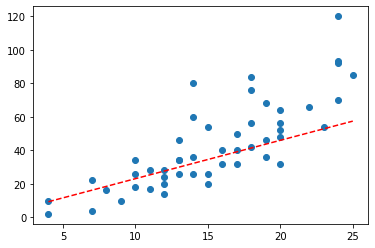

Epoch: 57, Loss: 18193.22, a: 0.12,  b:2.29


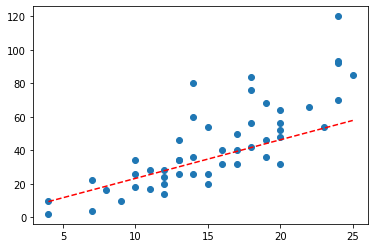

Epoch: 58, Loss: 17920.23, a: 0.12,  b:2.31


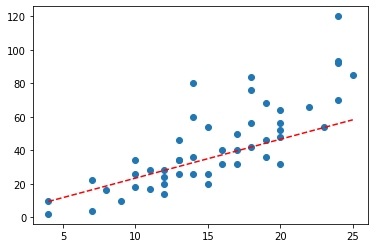

Epoch: 59, Loss: 17661.53, a: 0.12,  b:2.32


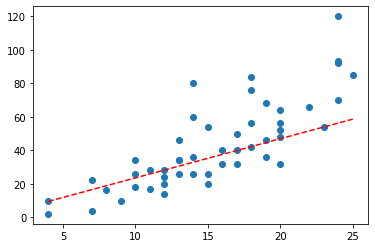

Epoch: 60, Loss: 17416.39, a: 0.12,  b:2.34


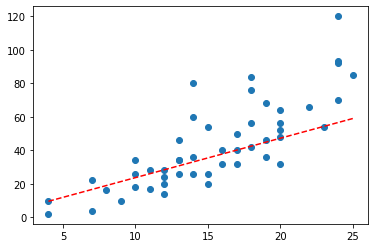

Epoch: 61, Loss: 17184.08, a: 0.13,  b:2.35


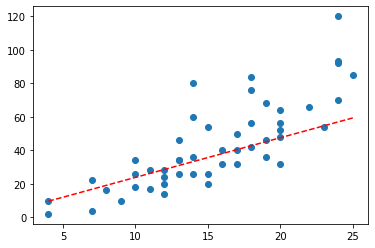

Epoch: 62, Loss: 16963.95, a: 0.13,  b:2.37


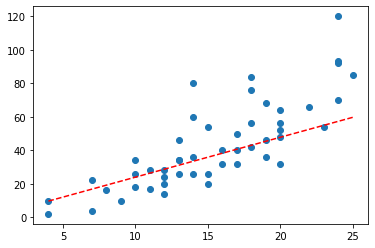

Epoch: 63, Loss: 16755.34, a: 0.13,  b:2.38


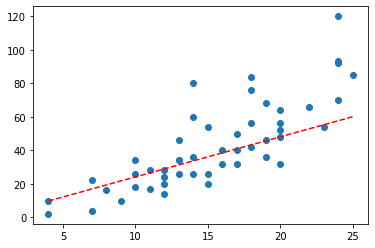

Epoch: 64, Loss: 16557.67, a: 0.13,  b:2.40


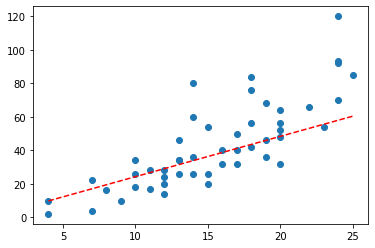

Epoch: 65, Loss: 16370.34, a: 0.13,  b:2.41


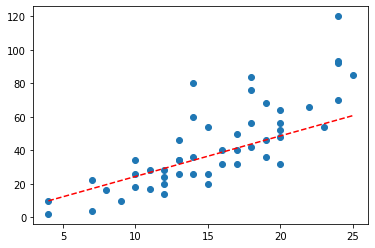

Epoch: 66, Loss: 16192.83, a: 0.13,  b:2.42


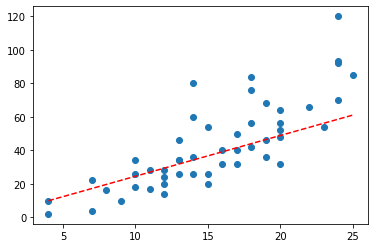

Epoch: 67, Loss: 16024.62, a: 0.13,  b:2.43


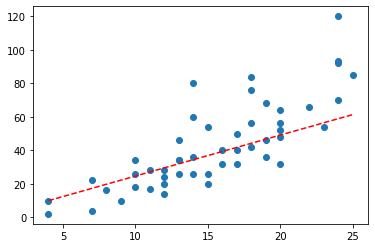

Epoch: 68, Loss: 15865.21, a: 0.13,  b:2.45


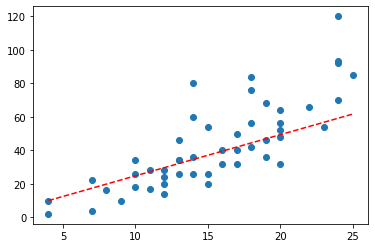

Epoch: 69, Loss: 15714.15, a: 0.13,  b:2.46


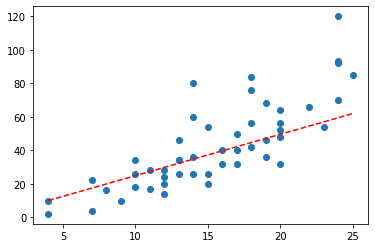

Epoch: 70, Loss: 15571.01, a: 0.13,  b:2.47


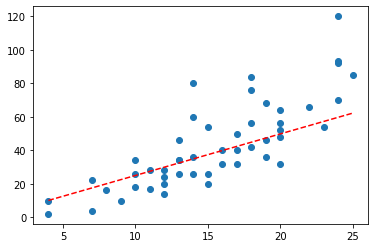

Epoch: 71, Loss: 15435.36, a: 0.13,  b:2.48


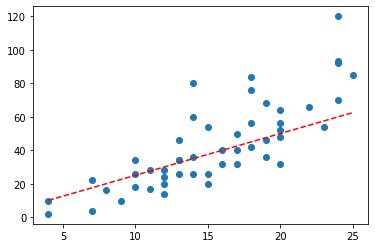

Epoch: 72, Loss: 15306.82, a: 0.13,  b:2.49


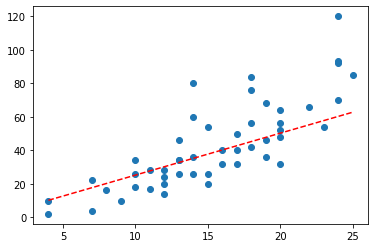

Epoch: 73, Loss: 15185.01, a: 0.13,  b:2.50


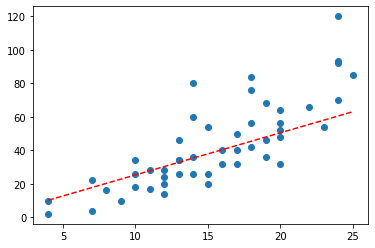

Epoch: 74, Loss: 15069.58, a: 0.13,  b:2.51


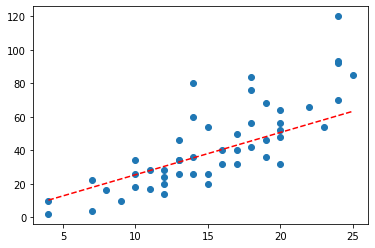

Epoch: 75, Loss: 14960.19, a: 0.13,  b:2.52


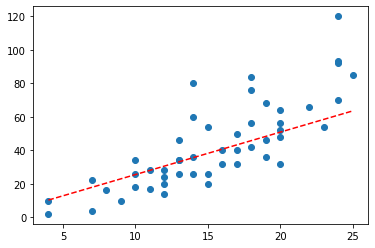

Epoch: 76, Loss: 14856.53, a: 0.13,  b:2.53


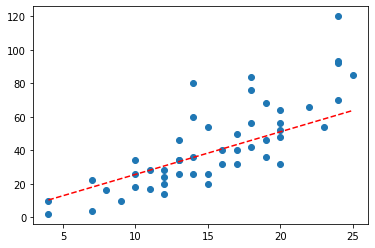

Epoch: 77, Loss: 14758.31, a: 0.13,  b:2.54


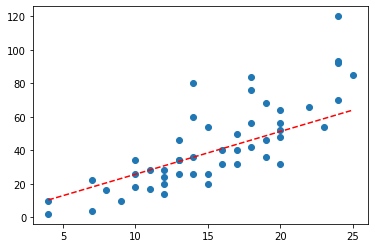

Epoch: 78, Loss: 14665.22, a: 0.13,  b:2.55


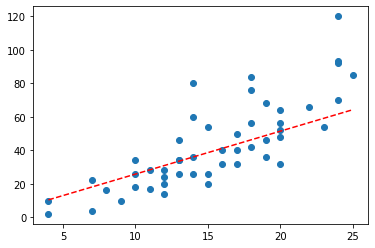

Epoch: 79, Loss: 14577.01, a: 0.13,  b:2.56


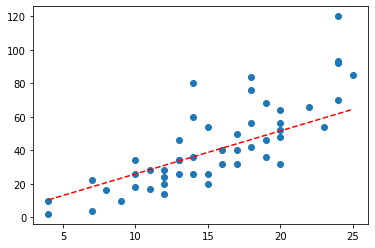

Epoch: 80, Loss: 14493.42, a: 0.13,  b:2.57


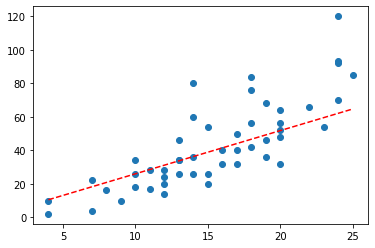

Epoch: 81, Loss: 14414.21, a: 0.14,  b:2.58


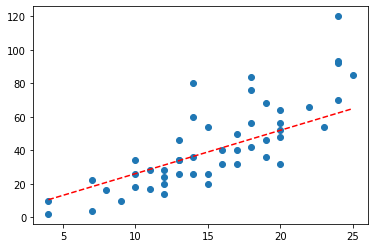

Epoch: 82, Loss: 14339.14, a: 0.14,  b:2.59


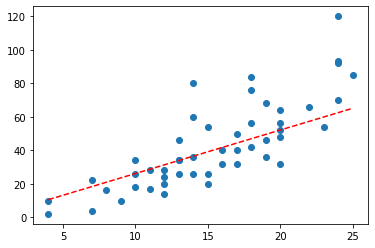

Epoch: 83, Loss: 14268.00, a: 0.14,  b:2.60


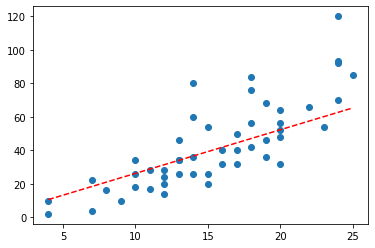

Epoch: 84, Loss: 14200.59, a: 0.14,  b:2.61


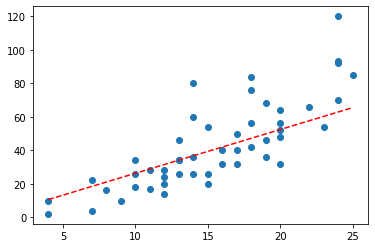

Epoch: 85, Loss: 14136.71, a: 0.14,  b:2.61


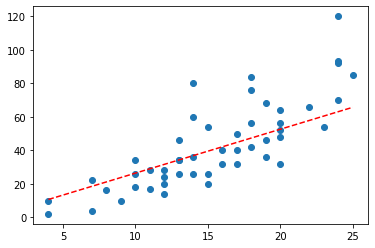

Epoch: 86, Loss: 14076.18, a: 0.14,  b:2.62


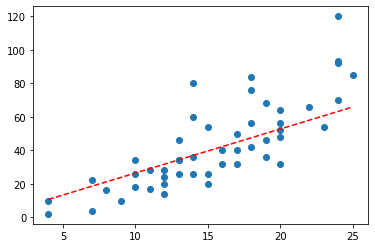

Epoch: 87, Loss: 14018.81, a: 0.14,  b:2.63


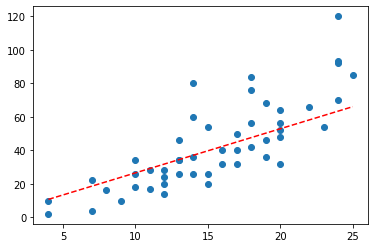

Epoch: 88, Loss: 13964.45, a: 0.14,  b:2.64


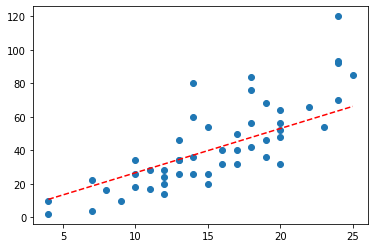

Epoch: 89, Loss: 13912.93, a: 0.14,  b:2.64


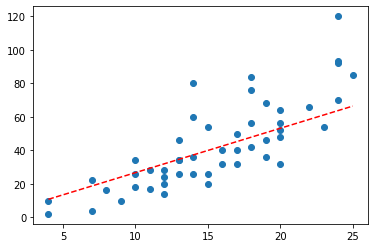

Epoch: 90, Loss: 13864.11, a: 0.14,  b:2.65


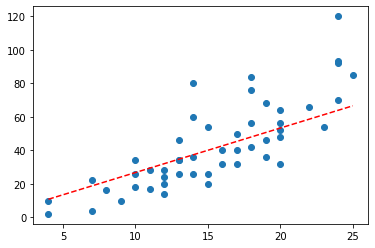

Epoch: 91, Loss: 13817.85, a: 0.14,  b:2.66


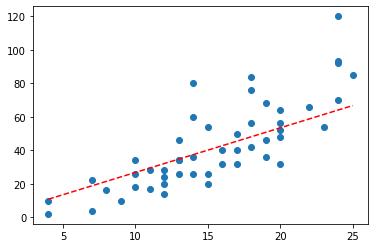

Epoch: 92, Loss: 13774.01, a: 0.14,  b:2.66


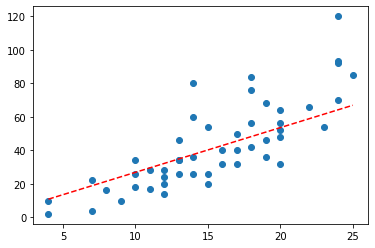

Epoch: 93, Loss: 13732.46, a: 0.14,  b:2.67


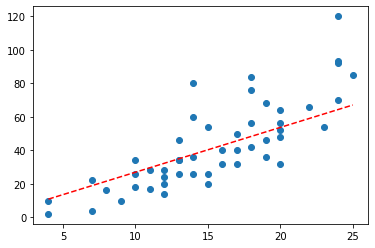

Epoch: 94, Loss: 13693.09, a: 0.14,  b:2.67


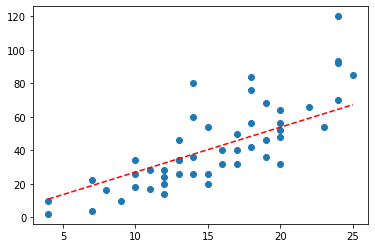

Epoch: 95, Loss: 13655.78, a: 0.14,  b:2.68


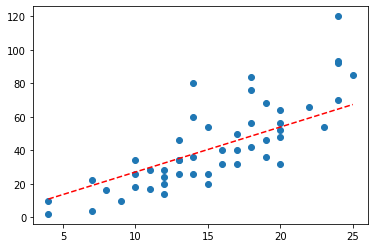

Epoch: 96, Loss: 13620.42, a: 0.14,  b:2.69


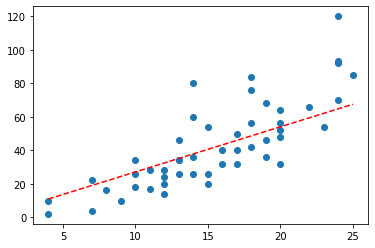

Epoch: 97, Loss: 13586.91, a: 0.14,  b:2.69


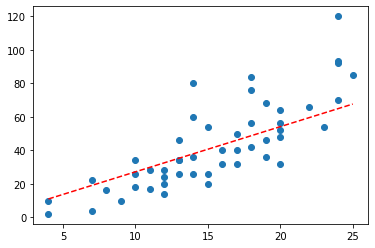

Epoch: 98, Loss: 13555.16, a: 0.14,  b:2.70


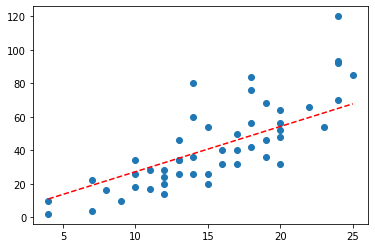

Epoch: 99, Loss: 13525.06, a: 0.14,  b:2.70


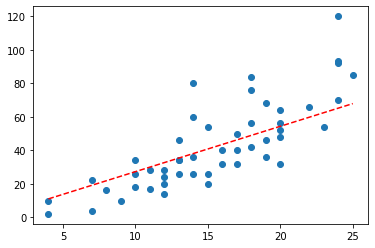

Epoch: 100, Loss: 13496.54, a: 0.14,  b:2.71


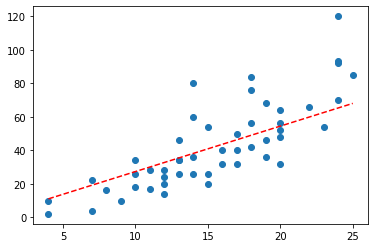

Epoch: 101, Loss: 13469.52, a: 0.14,  b:2.71


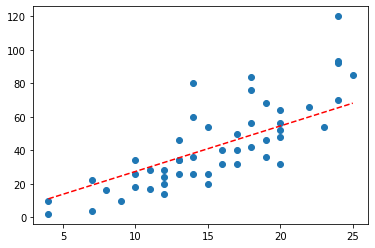

Epoch: 102, Loss: 13443.91, a: 0.14,  b:2.72


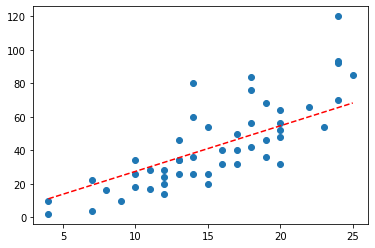

Epoch: 103, Loss: 13419.63, a: 0.14,  b:2.72


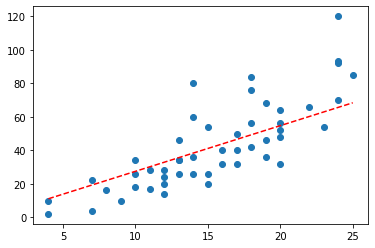

Epoch: 104, Loss: 13396.63, a: 0.14,  b:2.73


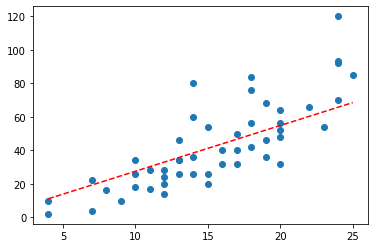

Epoch: 105, Loss: 13374.83, a: 0.14,  b:2.73


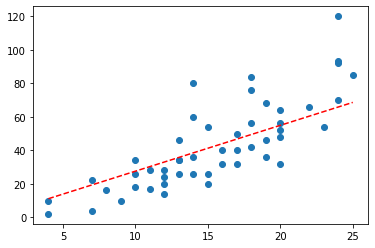

Epoch: 106, Loss: 13354.18, a: 0.14,  b:2.74


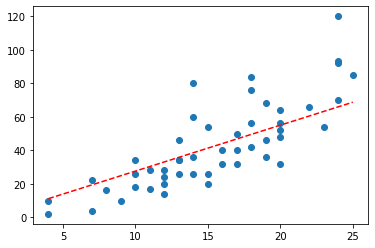

Epoch: 107, Loss: 13334.60, a: 0.14,  b:2.74


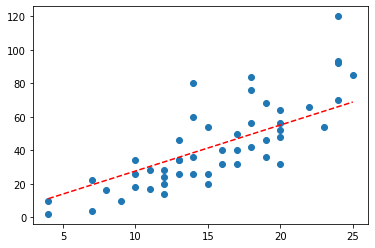

Epoch: 108, Loss: 13316.05, a: 0.14,  b:2.75


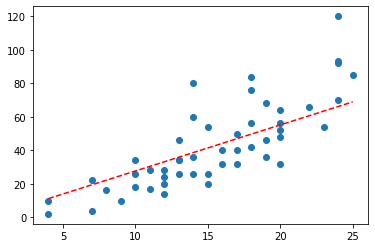

Epoch: 109, Loss: 13298.46, a: 0.14,  b:2.75


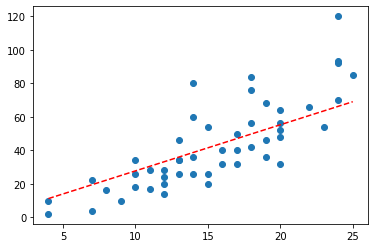

Epoch: 110, Loss: 13281.80, a: 0.14,  b:2.75


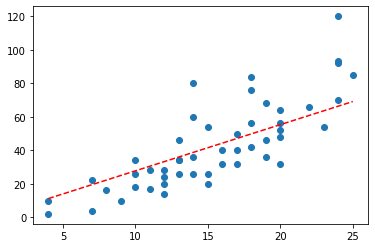

Epoch: 111, Loss: 13266.00, a: 0.14,  b:2.76


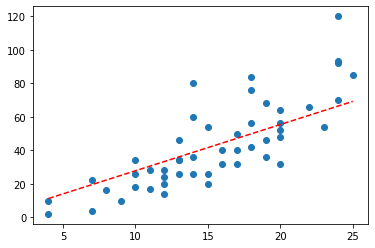

Epoch: 112, Loss: 13251.03, a: 0.14,  b:2.76


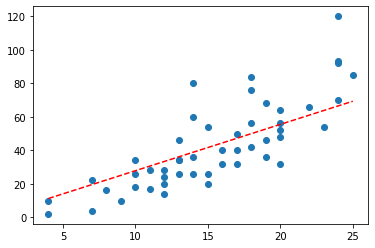

Epoch: 113, Loss: 13236.85, a: 0.14,  b:2.77


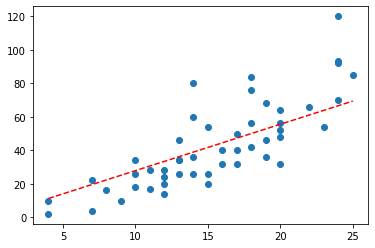

Epoch: 114, Loss: 13223.41, a: 0.14,  b:2.77


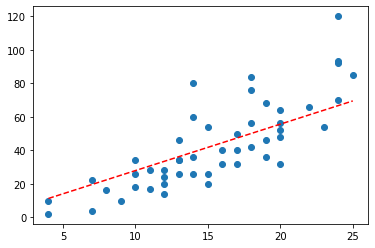

Epoch: 115, Loss: 13210.66, a: 0.14,  b:2.77


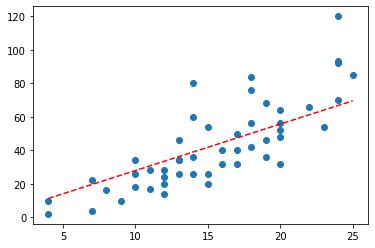

Epoch: 116, Loss: 13198.59, a: 0.14,  b:2.78


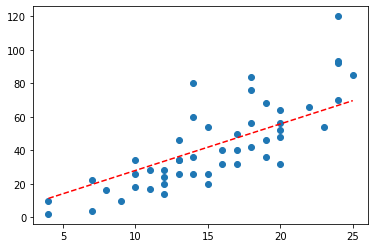

Epoch: 117, Loss: 13187.15, a: 0.14,  b:2.78


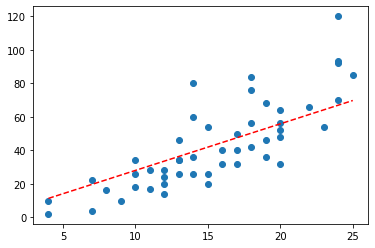

Epoch: 118, Loss: 13176.30, a: 0.14,  b:2.78


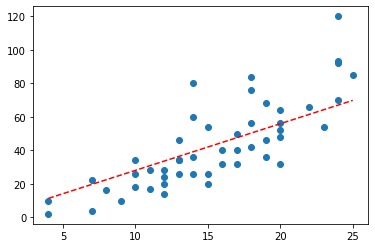

Epoch: 119, Loss: 13166.02, a: 0.14,  b:2.79


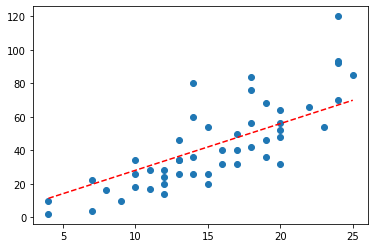

Epoch: 120, Loss: 13156.27, a: 0.14,  b:2.79


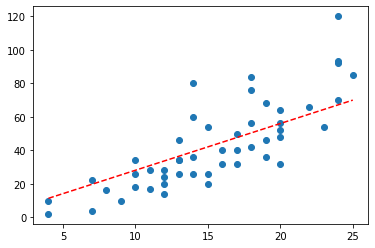

Epoch: 121, Loss: 13147.04, a: 0.14,  b:2.79


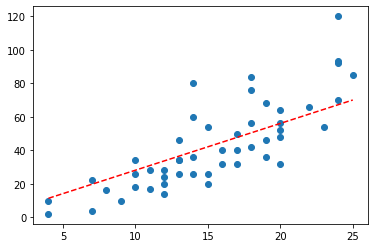

Epoch: 122, Loss: 13138.28, a: 0.14,  b:2.79


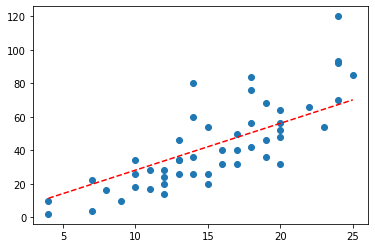

Epoch: 123, Loss: 13129.99, a: 0.14,  b:2.80


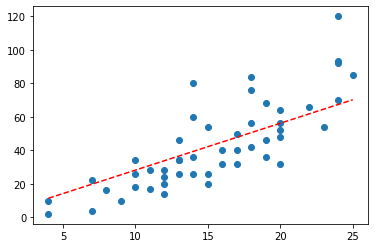

Epoch: 124, Loss: 13122.12, a: 0.14,  b:2.80


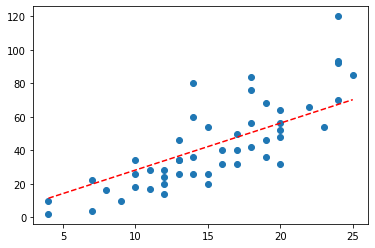

Epoch: 125, Loss: 13114.67, a: 0.14,  b:2.80


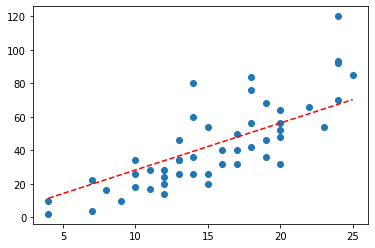

Epoch: 126, Loss: 13107.61, a: 0.14,  b:2.81


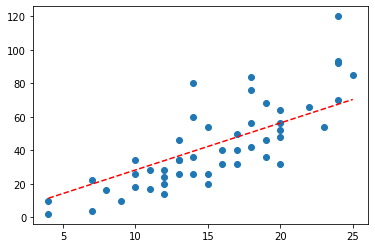

Epoch: 127, Loss: 13100.91, a: 0.14,  b:2.81


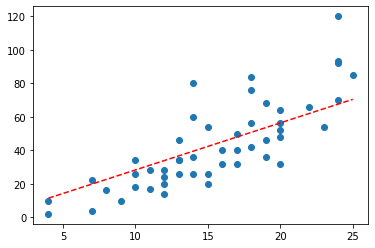

Epoch: 128, Loss: 13094.56, a: 0.14,  b:2.81


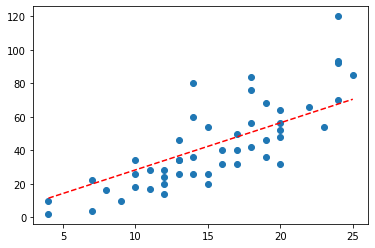

Epoch: 129, Loss: 13088.55, a: 0.14,  b:2.81


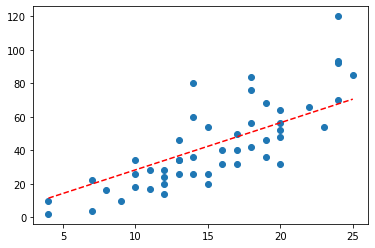

Epoch: 130, Loss: 13082.84, a: 0.14,  b:2.81


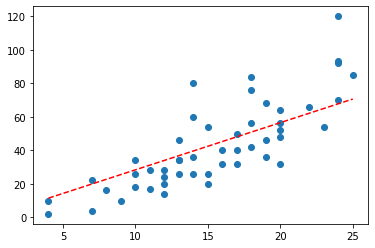

Epoch: 131, Loss: 13077.44, a: 0.14,  b:2.82


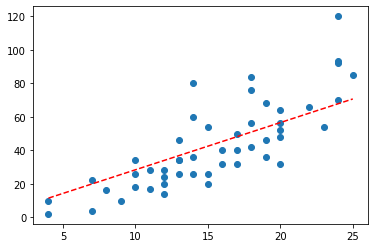

Epoch: 132, Loss: 13072.31, a: 0.14,  b:2.82


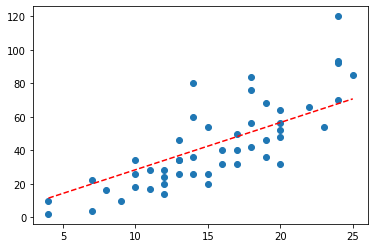

Epoch: 133, Loss: 13067.46, a: 0.14,  b:2.82


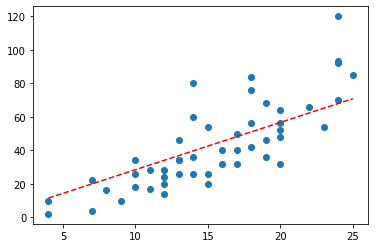

Epoch: 134, Loss: 13062.85, a: 0.14,  b:2.82


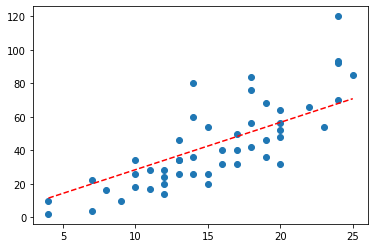

Epoch: 135, Loss: 13058.48, a: 0.14,  b:2.83


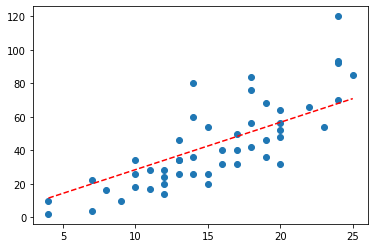

Epoch: 136, Loss: 13054.34, a: 0.14,  b:2.83


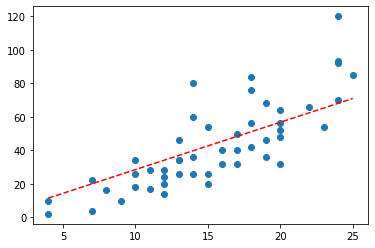

Epoch: 137, Loss: 13050.42, a: 0.14,  b:2.83


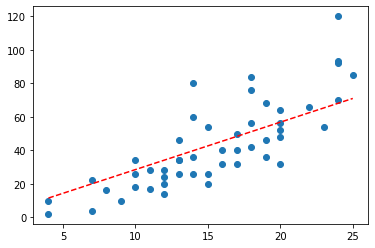

Epoch: 138, Loss: 13046.70, a: 0.14,  b:2.83


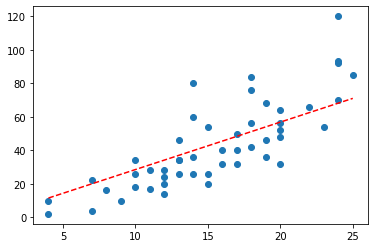

Epoch: 139, Loss: 13043.17, a: 0.14,  b:2.83


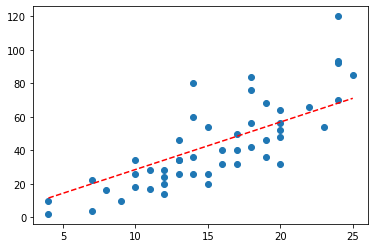

Epoch: 140, Loss: 13039.83, a: 0.14,  b:2.84


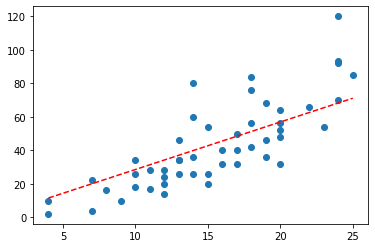

Epoch: 141, Loss: 13036.66, a: 0.14,  b:2.84


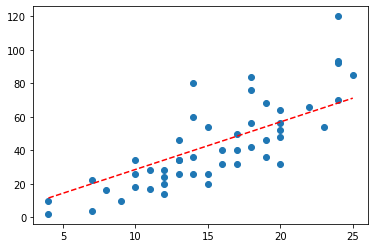

Epoch: 142, Loss: 13033.66, a: 0.14,  b:2.84


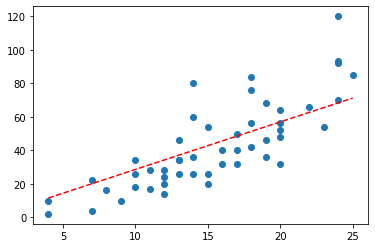

Epoch: 143, Loss: 13030.80, a: 0.14,  b:2.84


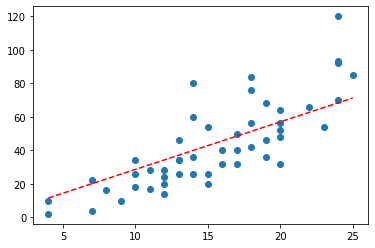

Epoch: 144, Loss: 13028.10, a: 0.14,  b:2.84


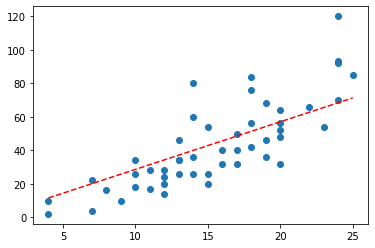

Epoch: 145, Loss: 13025.54, a: 0.14,  b:2.84


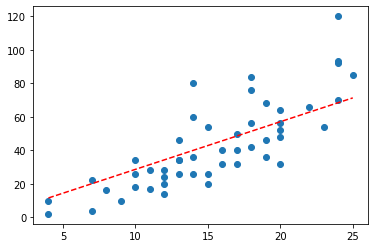

Epoch: 146, Loss: 13023.11, a: 0.14,  b:2.84


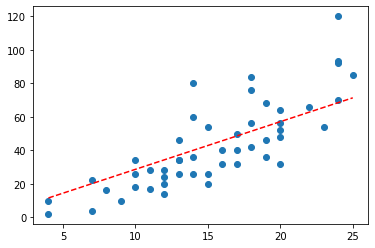

Epoch: 147, Loss: 13020.80, a: 0.14,  b:2.85


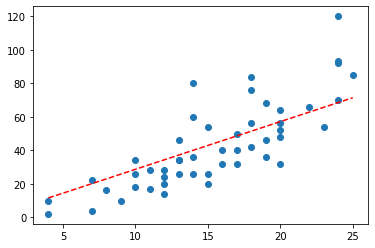

Epoch: 148, Loss: 13018.62, a: 0.14,  b:2.85


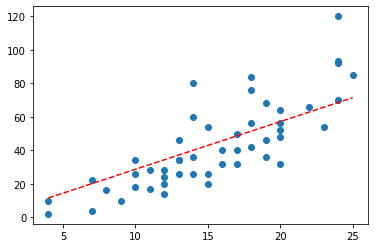

Epoch: 149, Loss: 13016.54, a: 0.14,  b:2.85


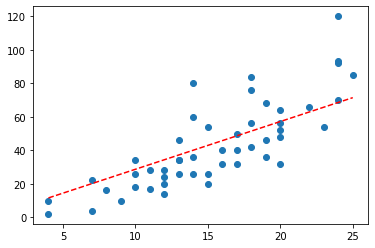

Epoch: 150, Loss: 13014.58, a: 0.14,  b:2.85


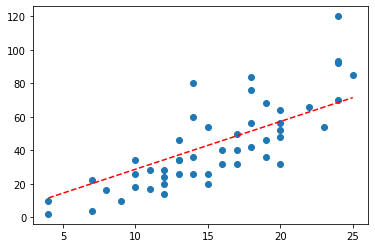

Epoch: 151, Loss: 13012.71, a: 0.14,  b:2.85


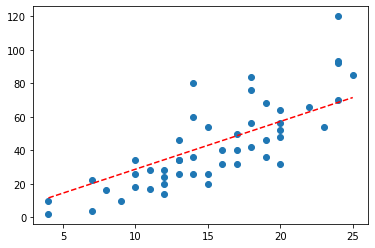

Epoch: 152, Loss: 13010.94, a: 0.14,  b:2.85


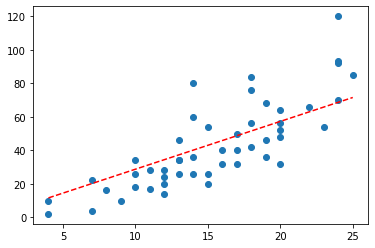

Epoch: 153, Loss: 13009.27, a: 0.14,  b:2.85


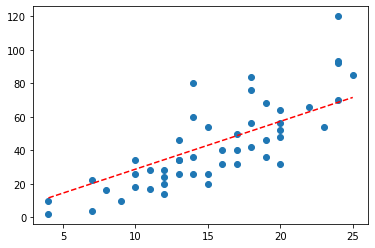

Epoch: 154, Loss: 13007.68, a: 0.14,  b:2.86


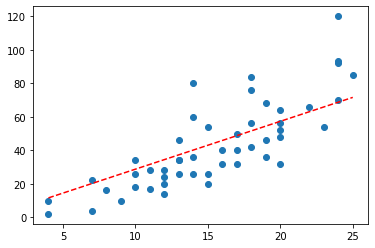

Epoch: 155, Loss: 13006.16, a: 0.14,  b:2.86


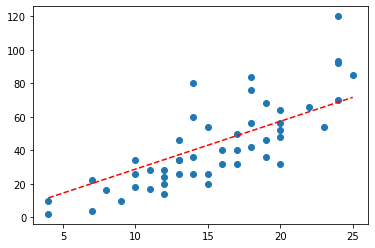

Epoch: 156, Loss: 13004.73, a: 0.14,  b:2.86


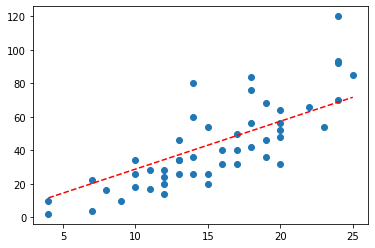

Epoch: 157, Loss: 13003.37, a: 0.14,  b:2.86


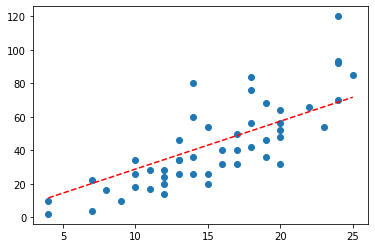

Epoch: 158, Loss: 13002.08, a: 0.14,  b:2.86


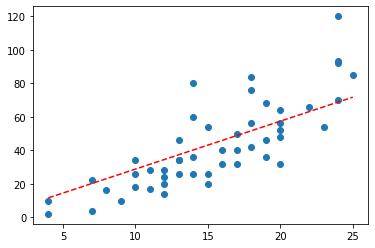

Epoch: 159, Loss: 13000.86, a: 0.14,  b:2.86


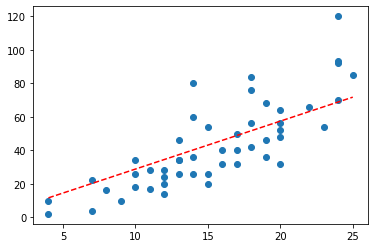

Epoch: 160, Loss: 12999.69, a: 0.14,  b:2.86


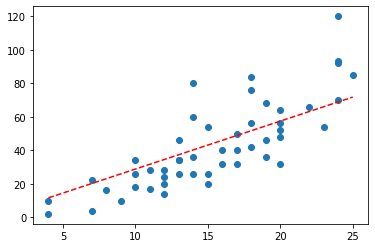

Epoch: 161, Loss: 12998.59, a: 0.14,  b:2.86


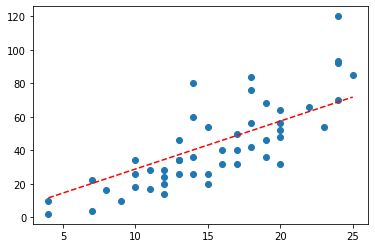

Epoch: 162, Loss: 12997.54, a: 0.14,  b:2.86


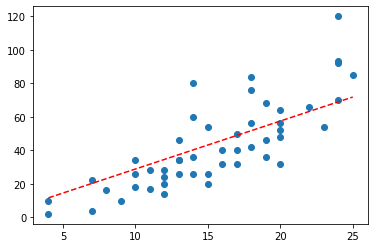

Epoch: 163, Loss: 12996.55, a: 0.14,  b:2.87


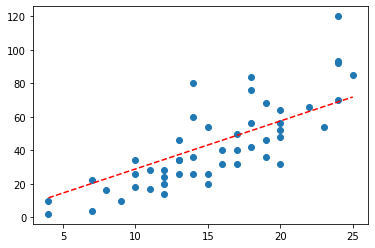

Epoch: 164, Loss: 12995.61, a: 0.14,  b:2.87


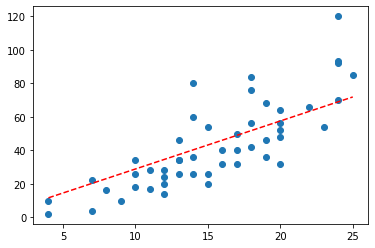

Epoch: 165, Loss: 12994.71, a: 0.14,  b:2.87


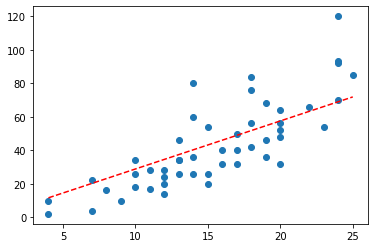

Epoch: 166, Loss: 12993.86, a: 0.14,  b:2.87


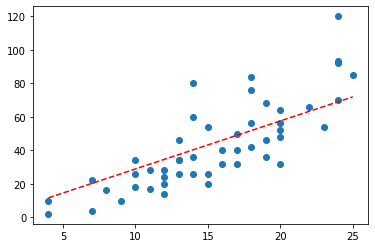

Epoch: 167, Loss: 12993.05, a: 0.14,  b:2.87


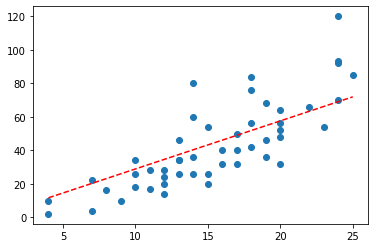

Epoch: 168, Loss: 12992.29, a: 0.14,  b:2.87


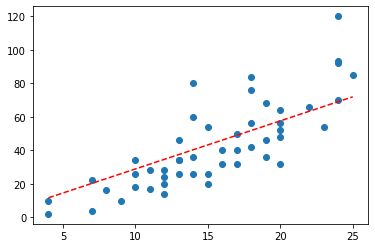

Epoch: 169, Loss: 12991.56, a: 0.14,  b:2.87


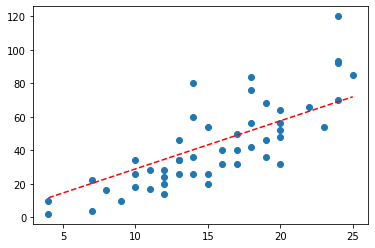

Epoch: 170, Loss: 12990.86, a: 0.14,  b:2.87


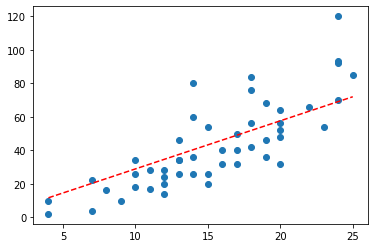

Epoch: 171, Loss: 12990.21, a: 0.14,  b:2.87


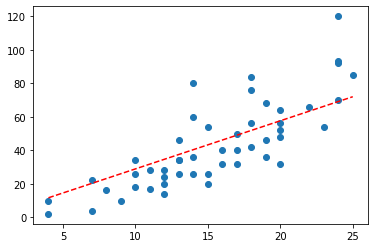

Epoch: 172, Loss: 12989.58, a: 0.14,  b:2.87


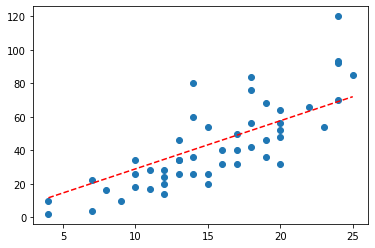

Epoch: 173, Loss: 12988.99, a: 0.14,  b:2.87


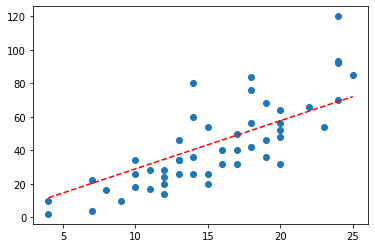

Epoch: 174, Loss: 12988.42, a: 0.14,  b:2.87


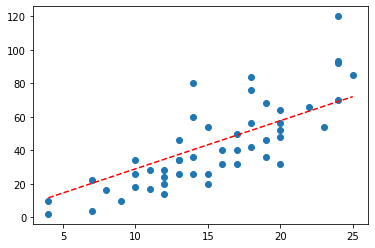

Epoch: 175, Loss: 12987.88, a: 0.14,  b:2.88


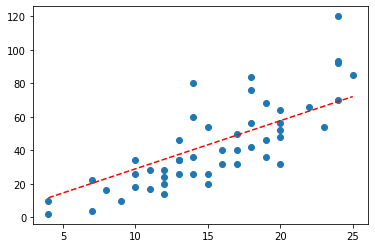

Epoch: 176, Loss: 12987.38, a: 0.13,  b:2.88


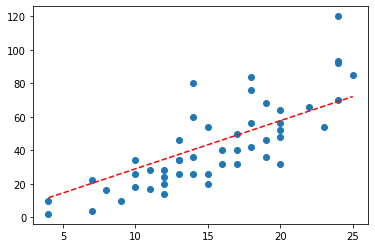

Epoch: 177, Loss: 12986.89, a: 0.13,  b:2.88


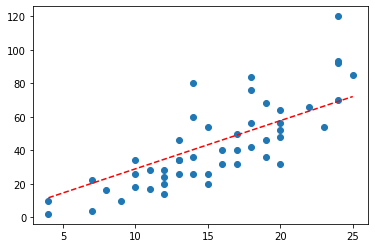

Epoch: 178, Loss: 12986.43, a: 0.13,  b:2.88


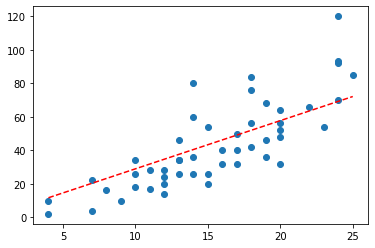

Epoch: 179, Loss: 12985.99, a: 0.13,  b:2.88


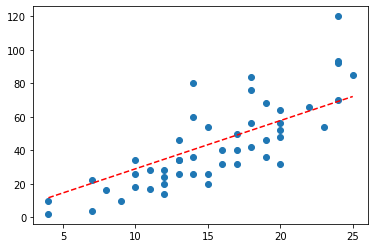

Epoch: 180, Loss: 12985.57, a: 0.13,  b:2.88


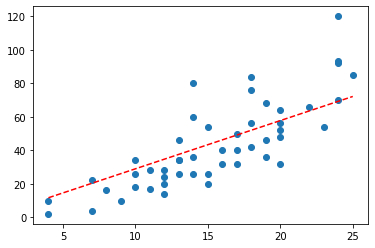

Epoch: 181, Loss: 12985.17, a: 0.13,  b:2.88


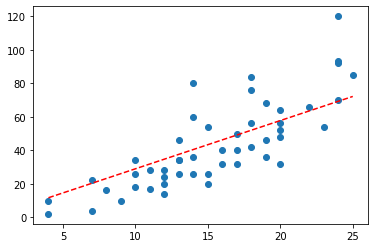

Epoch: 182, Loss: 12984.79, a: 0.13,  b:2.88


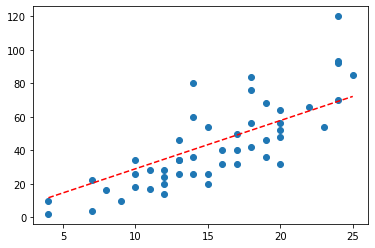

Epoch: 183, Loss: 12984.43, a: 0.13,  b:2.88


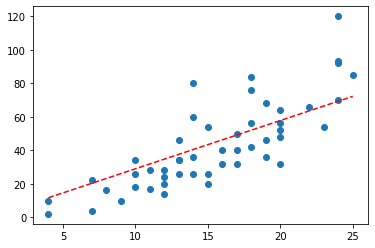

Epoch: 184, Loss: 12984.09, a: 0.13,  b:2.88


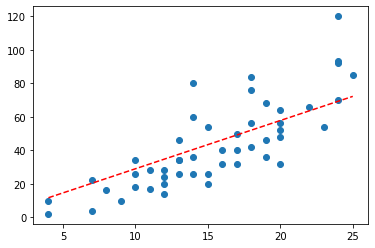

Epoch: 185, Loss: 12983.76, a: 0.13,  b:2.88


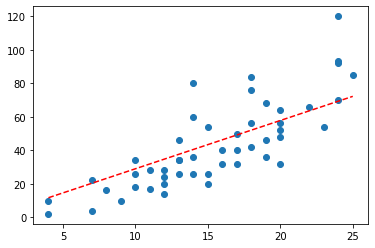

Epoch: 186, Loss: 12983.45, a: 0.13,  b:2.88


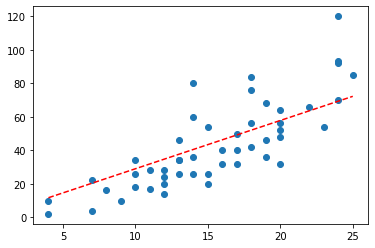

Epoch: 187, Loss: 12983.15, a: 0.13,  b:2.88


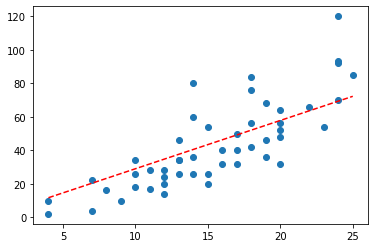

Epoch: 188, Loss: 12982.87, a: 0.13,  b:2.88


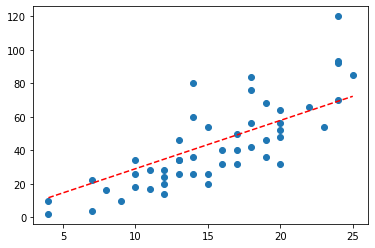

Epoch: 189, Loss: 12982.60, a: 0.13,  b:2.88


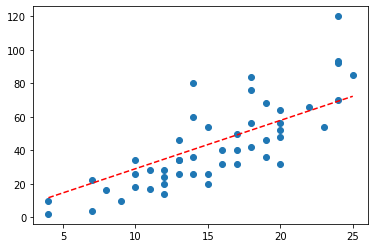

Epoch: 190, Loss: 12982.34, a: 0.13,  b:2.88


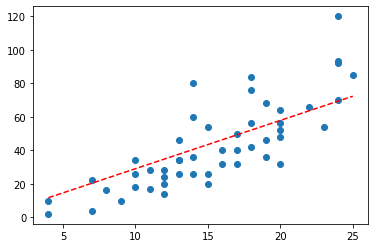

Epoch: 191, Loss: 12982.09, a: 0.13,  b:2.88


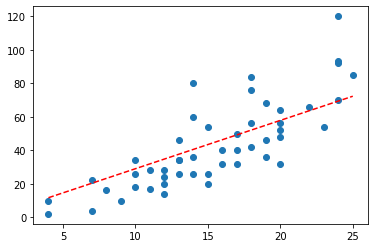

Epoch: 192, Loss: 12981.86, a: 0.13,  b:2.88


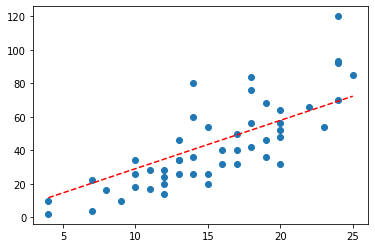

Epoch: 193, Loss: 12981.63, a: 0.13,  b:2.89


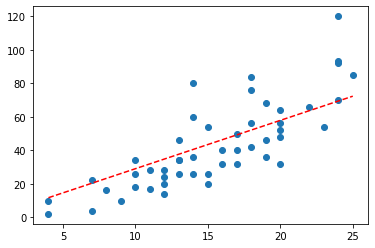

Epoch: 194, Loss: 12981.42, a: 0.13,  b:2.89


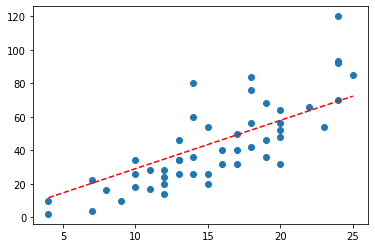

Epoch: 195, Loss: 12981.21, a: 0.13,  b:2.89


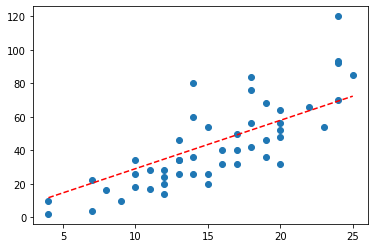

Epoch: 196, Loss: 12981.02, a: 0.13,  b:2.89


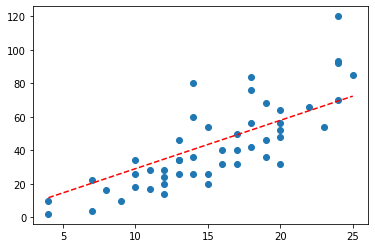

Epoch: 197, Loss: 12980.83, a: 0.13,  b:2.89


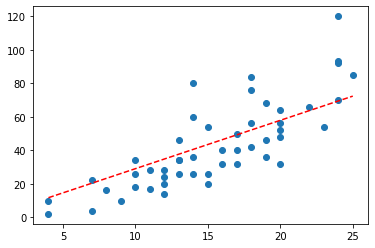

Epoch: 198, Loss: 12980.65, a: 0.13,  b:2.89


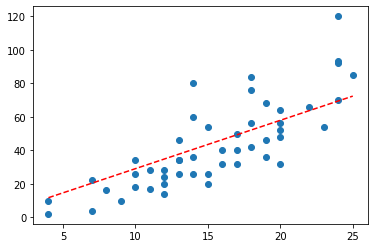

Epoch: 199, Loss: 12980.48, a: 0.13,  b:2.89


In [ ]:
# training model
model = regression()
a_values = []
b_values = []
cost_values = []
# epochs
epochs = 200
# learning rate
learning_rate = 0.000001

for epoch in range(epochs):
    a_values.append(model.a)
    b_values.append(model.b)
    # prediction values and error
    y_pred = model(X)
    cost_value = loss_func(y,y_pred)
    cost_values.append(cost_value)
    # training
    train(model,X,y,learning_rate)
    # visualize the scatter
    plot_scatter(X,y)
    plt.show()
    # print the value
    print('Epoch: %d, Loss: %0.2f, a: %0.2f,  b:%0.2f'%(epoch,cost_value,a_values[-1],b_values[-1]))

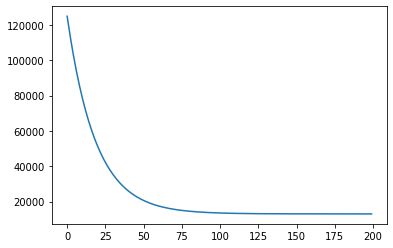

In [ ]:
plt.plot(cost_values) # visualizing cost function based on epochs

### **TensorFlow - Keras**

In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras import layers

In [ ]:
def regression_keras(learning_rate):
    model_keras = Sequential([
                            layers.Dense(units=1,input_shape=(1,))
    ])
    # optimzation
    loss_keras = tf.keras.losses.mean_squared_error
    optimizer_keras = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    model_keras.compile(loss=loss_keras,optimizer=optimizer_keras,metrics=['mse'])

    return model_keras

In [ ]:
model_k = regression_keras(learning_rate=0.0001)
model_k.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1)                 2         
Total params: 2
Trainable params: 2
Non-trainable params: 0
_________________________________________________________________


In [ ]:
from tensorflow.keras.callbacks import TensorBoard

In [ ]:
tfb = TensorBoard(log_dir='regression')

In [ ]:
# train model
model_k = regression_keras(learning_rate=0.0001)
history = model_k.fit(x=X,y=y,epochs=100,callbacks=[tfb])

Epoch 1/100
2/2 [==============================] - 1s 101ms/step - loss: 923.4201 - mse: 923.4201
Epoch 2/100
2/2 [==============================] - 0s 4ms/step - loss: 787.8757 - mse: 787.8757
Epoch 3/100
2/2 [==============================] - 0s 7ms/step - loss: 678.7392 - mse: 678.7392
Epoch 4/100
2/2 [==============================] - 0s 8ms/step - loss: 597.9164 - mse: 597.9164
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 535.0814 - mse: 535.0814
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 483.2055 - mse: 483.2055
Epoch 7/100
2/2 [==============================] - 0s 5ms/step - loss: 439.9568 - mse: 439.9568
Epoch 8/100
2/2 [==============================] - 0s 5ms/step - loss: 405.7732 - mse: 405.7732
Epoch 9/100
2/2 [==============================] - 0s 5ms/step - loss: 377.4809 - mse: 377.4809
Epoch 10/100
2/2 [==============================] - 0s 5ms/step - loss: 355.1863 - mse: 355.1863
Epoch 11/100
2/2 [===================

In [ ]:
df_history = pd.DataFrame(history.history)

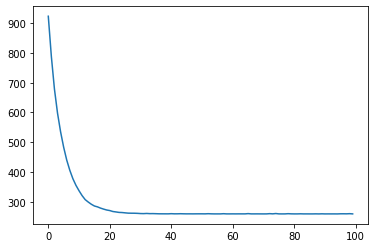

In [ ]:
df_history['loss'].plot(kind='line')

In [ ]:
model_k.get_weights()

[array([[2.8917615]], dtype=float32), array([0.02033692], dtype=float32)]

Text(0, 0.5, 'Y')

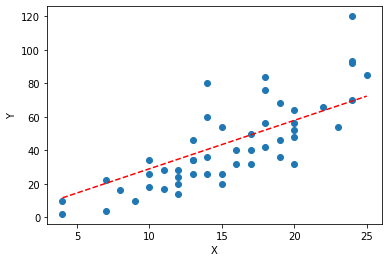

In [ ]:
y_pred_keras = model_k.predict(X)
plt.scatter(X,y)
plt.plot(X,y_pred_keras,'r--')
plt.xlabel('X')
plt.ylabel('Y')

### **TensorBoard**

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir regression

<IPython.core.display.Javascript object>

---
*Thanks,*

